Updated checkpoints: https://disk.yandex.ru/d/cK1PQ1-nn3PbKg

# Домашнее задание

1) В этой домашней работе вам предстоит решить задачу сегментации объект/фон на датасете PascalVoc2012. . Это такая же задача, как мы решали на семинаре, поэтому пользуйтесь наработками и рекомендациями

2) необходимо дополнить список аугментаций (>= 2) : https://pytorch.org/vision/master/transforms.html , https://albumentations.ai

3) Добавить понятные метрики на валидацию mean-IoU 

4) Добавить лосс Jaccard loss или DICE loss к BCE: https://arxiv.org/pdf/2006.14822.pdf

5) Взять непредобученную модель(можно использовать UNET из семинара, взять другую, реализовать свою) 

6) Пообучать модель несколько эпох 

7) Показать результаты работы - графики mean-IoU, лосс и примеры работы


In [2]:
data_path = "/kaggle/input/data"
checkpoints_path = "kaggle/input/hw7-segmentation-and-models"
checkpoints_file = "checkpoints.zip"

# Prepare data

In [2]:
# !wget https://data.deepai.org/PascalVOC2012.zip
# !unzip PascalVOC2012.zip
# !mv voc2012 VOCdevkit

In [8]:
# !pip install segmentation_models_pytorch
# !python -m pip install pytorch-lightning

In [6]:
# import os
# from zipfile import ZipFile
# if not os.path.exists(checkpoints_path):
#     raise FileNotFoundError("Скачайте архив с обученными моделями")

# with ZipFile(f"{checkpoints_path}/{checkpoints_file}", "r") as zf:
#     zf.extractall(checkpoints_path)

In [9]:
%load_ext autoreload
%autoreload 2
%matplotlib inline
import random

import cv2
import torch
import torchvision
import numpy as np
import pytorch_lightning as pl
import segmentation_models_pytorch as smp
from matplotlib import pyplot as plt
from PIL import Image
from torchvision.datasets import VOCSegmentation

print("Torch", torch.__version__)

USE_CUDA = torch.cuda.is_available()
if USE_CUDA:
    DEVICE="cuda"
    print("Use CUDA")
else:
    DEVICE="cpu"
    
# Параметры тренировки и визуализации.
TRAIN = True  # Если False, будут использоваться заранее посчитанные графики
              # вместо реальной тренировки (полезно для демонстрации на ноутбуках без GPU).

def set_figure_size(figsize=(8, 6), dpi=120):
    plt.figure(figsize=figsize, dpi=dpi)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Torch 2.0.0
Use CUDA


In [10]:
print(DEVICE)

cuda


# Тренировка Unet на Pascal VOC.

## Подготовка данных

Мы будем использовать корпус Pascal VOC.

In [25]:
DATA_ROOT = "/kaggle/input/hw7-segmentation-models-and-pascalvoc/PascalVOC2012"
VOC_YEAR = "2012"
LABELS = ["background", "aeroplane", "bicycle", "bird", "boat", "bottle",
          "bus", "car", "cat", "chair", "cow", "diningtable", "dog", "horse",
          "motorbike", "person", "potted_plant", "sheep", "sofa", "train", "tv/monitor"]
MULTICLASS = False  # Если False, отделяем объекты от фона, иначе распознаем класс объектов.
NUM_CLASSES = len(LABELS) if MULTICLASS else 2
print("Number of classes:", NUM_CLASSES)

Number of classes: 2


Mask values: {0, 6, 255}


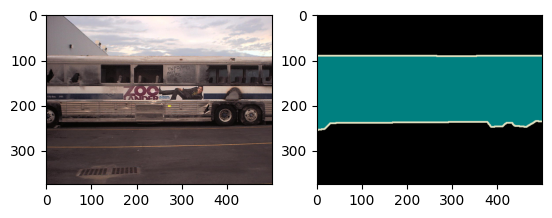

In [27]:
# Посмотрим на валидационную часть корпуса.
valset_raw = VOCSegmentation(DATA_ROOT, VOC_YEAR, "val", download=False)

image, mask = valset_raw[random.randint(0, len(valset_raw) - 1)]
print("Mask values:", set(np.array(mask).flatten().tolist()))

fig, axs = plt.subplots(1, 2)
axs[0].imshow(image)
axs[1].imshow(mask)
plt.show()

Маска содержит номера классов для каждого пикселя. Имеется две специальные метки: 0 для фона и 255 для контура. Контур мы уберем.

In [28]:
for _ in range(5):
    i = random.randint(0, len(valset_raw) - 1)
    print("Image {:05d} size: {}".format(i, valset_raw[i][0].size))

Image 00843 size: (500, 375)
Image 00392 size: (500, 278)
Image 00543 size: (500, 341)
Image 00586 size: (500, 375)
Image 00501 size: (375, 500)


In [30]:
import cv2
import random
import numpy as np
from PIL import Image


class AffineAugmenter(object):
    def __init__(self, min_scale=0.9, max_offset=0.1, rotate=True):
        self._min_scale = min_scale
        self._max_offset = max_offset
        self._rotate = rotate

    def __call__(self, image, mask):
        image = np.array(image)  # PIL -> Numpy.
        mask = np.array(mask)
        h, w, c = image.shape
        assert c == 3
        if self._rotate:
            angle = random.random() * np.pi / 2 - np.pi / 4
        else:
            angle = 0
        scale = self._min_scale + random.random() * (1 - self._min_scale)
        rotation = cv2.getRotationMatrix2D(((w // 2), (h // 2)), angle * 180 / np.pi, scale)
        x_offset = random.randint(-int(self._max_offset * w), int(self._max_offset * w))
        y_offset = random.randint(-int(self._max_offset * h), int(self._max_offset * h))
        rotation[:, 2] += [x_offset, y_offset]
        new_image = cv2.warpAffine(image, rotation, (w, h), borderValue=(128, 128, 128))
        new_mask = cv2.warpAffine(mask, rotation, (w, h), borderValue=(0, 0, 0), flags=cv2.INTER_NEAREST)
        return new_image, new_mask  # Numpy -> PIL.


class BrightnessContrastAugmenter(object):
    def __init__(self, brightness=0.3, contrast=0.3):
        self._brightness = brightness
        self._contrast = contrast

    def __call__(self, image, mask):
        image = np.array(image)  # PIL -> Numpy.
        h, w, c = image.shape
        assert c == 3
        brightness = 2 * (random.random() - 0.5) * self._brightness
        contrast = 1 + 2 * (random.random() - 0.5) * self._contrast
        new_image = image.astype(np.float16)
        new_image += 255 * brightness
        new_image = (new_image - 128) * contrast + 128
        return new_image.clip(0, 255).astype(np.uint8), mask  # Numpy -> PIL.


class BlurAugmenter(object):
    def __init__(self, max_kernel=5):
        self._max_kernel = max_kernel

    def __call__(self, image, mask):
        kernel = random.randint(0, self._max_kernel // 2) * 2 + 1
        if kernel == 1:
            return image, mask
        image = np.array(image)  # PIL -> Numpy.
        h, w, c = image.shape
        assert c == 3
        new_image = cv2.GaussianBlur(image, (kernel, kernel), sigmaX=kernel / 2)
        return new_image.clip(0, 255).astype(np.uint8), mask  # Numpy -> PIL.
    
    
class FlipAugmenter(object):
    def __call__(self, image, mask):
        a = random.randint(0, 3)
        if a == 0:
            image = np.flip(image, axis=0)
            mask = np.flip(mask, axis=0)
        elif a == 1:
            image = np.flip(image, axis=0)
            mask = np.flip(mask, axis=0)
            image = np.flip(image, axis=1)
            mask = np.flip(mask, axis=1)
        elif a == 2:
            image = np.flip(image, axis=1)
            mask = np.flip(mask, axis=1)
        return image, mask


class RandomAugmentation(object):
    def __init__(self, *augmenters):
        self._augmenters = list(augmenters)

    def __call__(self, image, mask):
        augmenter = random.choice(self._augmenters)
        return augmenter(image, mask)


## Добавим собственные аугментации

In [85]:
import albumentations as A

class ColorJitterAugmenter(object):
    def __init__(self, brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2):
        self.transform = A.Compose([
            A.RandomBrightness(limit=(1 - brightness, 1 + brightness), p=0.5),
            A.RandomContrast(limit=(1 - contrast, 1 + contrast), p=0.5),
            A.HueSaturationValue(hue_shift_limit=(-hue, hue), sat_shift_limit=(-saturation, saturation), val_shift_limit=0, p=0.5)
        ])
    
    def __call__(self, image, mask):
        augmented = self.transform(image=image)
        return augmented["image"], mask

class ElasticTransformAugmenter(object):
    def __init__(self, alpha=1, sigma=50, alpha_affine=50):
        self.transform = A.ElasticTransform(alpha=alpha, sigma=sigma, alpha_affine=alpha_affine)
    
    def __call__(self, image, mask):
        augmented = self.transform(image=image, mask=mask)
        return augmented["image"], augmented["mask"]


In [31]:
def image_to_numpy(image):
    """Convert Torch tensor to Numpy image."""
    if isinstance(image, np.ndarray):
        return image
    if image.dtype == torch.float32:
        image = image - image.min()
        image = 255 * image / max(1e-6, image.max())
    return image.to(torch.uint8).permute(1, 2, 0).cpu().numpy()

def image_to_torch(image, device=None):
    """Convert Numpy image to Torch tensor."""
    if isinstance(image, torch.Tensor):
        return image
    if image.shape[-1] == 4:
        image = image[..., :3]
    result = torch.from_numpy(np.ascontiguousarray(image))
    if device is not None:
        result = result.to(device)
    result = result.permute(2, 0, 1)
    return result

In [83]:
class Scaler(object):
    """Отмасштабировать изображения сохранив пропорции.
    
    Пустые места будут заполнены отражениями.

    Аргументы:
        image: Изображение в HWC формате.
        size: Требуемый размер, пара W, H.
    """
    def __init__(self, size):
        self._size = size
        self._padding = 0
    
    def set_padding(self, padding):
        self._padding = padding
        
    def __call__(self, image):
        if not isinstance(image, np.ndarray):
            image = np.array(image)
        grayscale = (len(image.shape) == 2)
        if grayscale:
            image = image[..., None]
        rw, rh = self._size
        p = self._padding
        h, w, c = image.shape
        scale_x = rw / w
        scale_y = rh / h
        scale = min(scale_x, scale_y)
        sw = int(scale * w)
        sh = int(scale * h)
        offset_x = p + (rw - sw) // 2
        offset_y = p + (rh - sh) // 2
        # Используем zeros на случай маленьких изображений.
        result = np.zeros((rh + 2 * p, rw + 2 * p, c), dtype=image.dtype)
        cv2.resize(image, (sw, sh),
                   interpolation=cv2.INTER_NEAREST if grayscale else cv2.INTER_AREA,
                   dst=result[offset_y:offset_y + sh, offset_x:offset_x + sw])

        # Отразить.
        result[offset_y:offset_y + sh, :offset_x] = result[offset_y:offset_y + sh, offset_x:2 * offset_x][:, ::-1]
        offset_end = result.shape[1] - offset_x - sw
        result[offset_y:offset_y + sh, offset_x + sw:] = result[offset_y:offset_y + sh, sw + offset_x - offset_end:sw + offset_x][:, ::-1]
        
        result[:offset_y] = result[offset_y:2 * offset_y][::-1]
        offset_end = result.shape[0] - offset_y - sh
        result[offset_y + sh:] = result[sh + offset_y - offset_end:sh + offset_y][::-1]
        
        if grayscale:
            result = result[:, :, 0]
        return result

    
def remove_borders_inplace(mask):
    mask[mask == 255] = 0
    return mask
    

class VOCDataset(torch.utils.data.Dataset):
    """Обертка для стандартного класса, которая форматирует данные."""
    def __init__(self, root, year, image_size,
                 multiclass=MULTICLASS,
                 download=False, augment=False,
                 train=False, train_fraction=0.8,
                 padding=0):
        """Создать корпус.
        
        Аргументы:
            root: Путь до папки для хранения данных.
            year: 2007 или 2012.
            image_size: Ширина и высота изображений.
            download: Скачать корпус, если он не найден в папке.
            augment: Применить аугментации.
            train: Выделить train часть, иначе validation.
            train_fraction: Доля тренировочных примеров.
            padding: Добавить дополнительный зеркальынй паддинг к изображению.
        """
        self._dataset = VOCSegmentation(root, str(year), "trainval", download=download)
        self._image_size = np.array(image_size)
        self._multiclass = multiclass
        self._padding = padding
        
        ids = list(range(len(self._dataset)))
        random.seed(0)
        random.shuffle(ids)
        train_size = int(len(ids) * train_fraction)
        self._indices = ids[:train_size] if train else ids[train_size:]

        self._image_scaler = Scaler(image_size)
        self._mask_scaler = Scaler(image_size)
        if augment:
            self._augmenter = RandomAugmentation(AffineAugmenter(),
                                                 BrightnessContrastAugmenter(),
                                                 BlurAugmenter(),
                                                 FlipAugmenter(),
                                                 ColorJitterAugmenter(),
                                                 ElasticTransformAugmenter(),
                                                )
        else:
            self._augmenter = lambda image, mask: (image, mask)
        
    @property
    def image_size(self):
        return self._image_size + self._padding * 2
    
    def set_padding(self, padding):
        self._padding = padding
        self._image_scaler.set_padding(padding)
        self._mask_scaler.set_padding(padding)
        
    def __len__(self):
        return len(self._indices)
    
    def __getitem__(self, idx):
        image, mask = self._dataset[self._indices[idx]]
        image = np.asarray(image)
        mask = np.array(mask)
        remove_borders_inplace(mask)
        if not self._multiclass:
            mask[mask > 0] = 1
        image = self._image_scaler(image)
        mask = self._mask_scaler(mask)
        image, mask = self._augmenter(image, mask)
        image = image_to_torch(image).float() - 0.5
        mask = image_to_torch(mask[..., None]).long()[0]
        return image, mask

IMAGE_SIZE = 512  # В исходной статье U-Net применяется к изображениям размера 572.

# Корпус был загружен выше, download = False.
trainset = VOCDataset(DATA_ROOT, VOC_YEAR, (IMAGE_SIZE, IMAGE_SIZE),
                      multiclass=MULTICLASS, train=True)
valset = VOCDataset(DATA_ROOT, VOC_YEAR, (IMAGE_SIZE, IMAGE_SIZE),
                    multiclass=MULTICLASS, train=False)
print("Image size:", IMAGE_SIZE)
print("Train set size:", len(trainset))
print("Validation set size:", len(valset))

Image size: 512
Train set size: 2330
Validation set size: 583


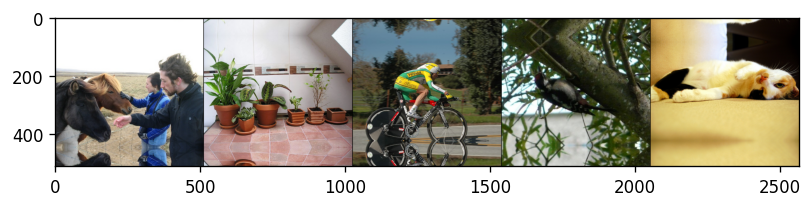

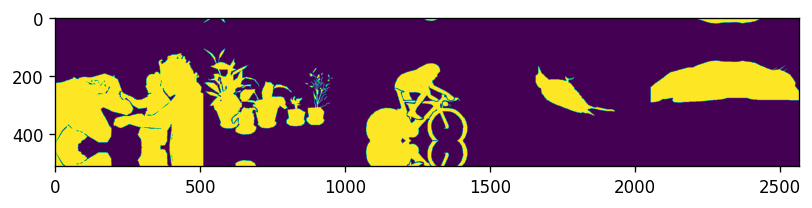

In [33]:
def show_dataset(dataset):
    images = []
    masks = []
    for _ in range(5):
        i = random.randint(0, len(valset) - 1)
        if len(images):
            separator = np.zeros((dataset.image_size[0], 2, 3), dtype=np.uint8)
            images.append(separator)
            masks.append(separator[:, :, 0])
        image, mask = dataset[i]
        images.append(image_to_numpy(image))
        masks.append(image_to_numpy(mask[None, ...])[..., 0])

    %matplotlib inline
    set_figure_size()
    plt.imshow(np.concatenate(images, axis=1))
    plt.show()
    set_figure_size()
    plt.imshow(np.concatenate(masks, axis=1))
    plt.show()
    
valset.set_padding(0)
show_dataset(trainset)

## IoU Metric

In [140]:
class MeanIoU(torchmetrics.Metric):
    def __init__(self, num_classes, threshold=0.5):
        super().__init__()
        self.num_classes = num_classes
        self.threshold = threshold
        self.add_state("intersection", default=torch.zeros(num_classes), dist_reduce_fx="sum")
        self.add_state("union", default=torch.zeros(num_classes), dist_reduce_fx="sum")

    def update(self, logits, targets):
        logits = (logits > self.threshold).float()

        # Приведите размеры logits и targets к единому размеру
        if logits.shape[-2:] != targets.shape[-2:]:
            logits = torch.nn.functional.interpolate(logits, size=targets.shape[-2:], mode='bilinear', align_corners=False)

        for class_idx in range(self.num_classes):
            class_logits = logits[:, 0, ...]  # У вас только один канал в logits
            class_targets = (targets == class_idx).float()
            intersection = torch.sum(class_logits * class_targets)
            union = torch.sum(class_logits) + torch.sum(class_targets) - intersection
            self.intersection[class_idx] += intersection
            self.union[class_idx] += union

    def compute(self):
        iou = self.intersection / self.union
        mean_iou = torch.mean(iou)
        return mean_iou


## Lighting module (Добавим метрику IoU)

In [141]:
import random
import numpy as np
import torch
import torchvision
import pytorch_lightning as pl
from torchvision.datasets import CIFAR10

class Module(pl.LightningModule):
    def __init__(self, model, loss_fn, optimizer_fn, trainset, testset,
                 lr_scheduler_fn=None,
                 batch_size=16):
        super().__init__()
        self._model = model
        self._optimizer_fn = optimizer_fn
        self._lr_scheduler_fn = lr_scheduler_fn
        self._criterion = loss_fn()
        self._batch_size = batch_size
        self._trainset = trainset
        self._testset = testset
        
    def forward(self, input):
        return self._model(input)
    
    def training_step(self, batch, batch_idx):
        # training_step defines the train loop. It is independent of forward
        x, y = batch
        logits = self._model(x)
        loss = self._criterion(logits, y)
        self.logger.experiment.add_scalars("loss", 
                                           {"train": loss}, 
                                           global_step=self.global_step)
        return loss
    
    def validation_step(self, batch, batch_idx):
        x, y = batch
        logits = self._model(x)
        loss = self._criterion(logits, y)
        self.logger.experiment.add_scalars("loss", 
                                           {"val": loss}, 
                                           global_step=self.global_step)
        
    def train_dataloader(self):
        return torch.utils.data.DataLoader(self._trainset, batch_size=self._batch_size, shuffle=True, drop_last=True, num_workers=2)
    
    def val_dataloader(self):
        return torch.utils.data.DataLoader(self._testset, batch_size=self._batch_size, shuffle=False, num_workers=2)

    def configure_optimizers(self):
        optimizer = self._optimizer_fn(self._model)
        scheduler = self._lr_scheduler_fn(optimizer)
        if scheduler:
            return [optimizer], [scheduler]
        else:
            return optimizer
    

def train_model(model, loss_fn, optimizer_fn, trainset, testset,
                lr_scheduler_fn=None,
                batch_size=4,
                eval_steps=250,
                num_epochs=1):
    model = Module(model, loss_fn, optimizer_fn, trainset, testset,
                   lr_scheduler_fn, batch_size)
    trainer = pl.Trainer(accelerator='auto', max_epochs=num_epochs, val_check_interval=eval_steps)
    trainer.fit(model)


class CheckerError(Exception):
    pass


def check_ok():
    print("========")
    print("CHECK OK")

def check_conv1x1(layer_fn):
    layer = layer_fn(2, 5)
    if not isinstance(layer, torch.nn.Conv2d):
        raise CheckerError("conv1x1: неверные тип слоя")
    if layer.kernel_size != (1, 1):
        raise CheckerError("conv1x1: неверный размер свертки")
    if layer.in_channels != 2 or layer.out_channels != 5:
        raise CheckerError("conv1x1: неверное количество каналов")

def check_t_conv(layer_fn):
    layer = layer_fn(2, 5)
    if not isinstance(layer, torch.nn.ConvTranspose2d):
        raise CheckerError("transposed2x2: неверные тип слоя")
    if layer.kernel_size != (2, 2):
        raise CheckerError("transposed2x2: неверный размер свертки")
    if layer.stride != (2, 2):
        raise CheckerError("transposed2x2: неверный шаг")
    if layer.in_channels != 2 or layer.out_channels != 5:
        raise CheckerError("transposed2x2: неверное количество каналов")
        
def check_bce_loss(loss_class):
    loss_computer = loss_class()
    if not isinstance(loss_computer._bce, torch.nn.BCEWithLogitsLoss):
        raise CheckerError("Неверный класс функции потерь")
    def to_logits(probs):
        return np.log(probs) - np.log(1 - probs)
    logits = torch.from_numpy(to_logits(np.array([0.9, 0.2]))).reshape(2, 1, 1, 1).float()
    labels = torch.from_numpy(np.array([1, 0])).reshape(2, 1, 1).long()
    value = loss_computer(logits, labels).item()
    if abs(value + np.mean(np.log([0.9, 0.8]))) > 1e-3:
        raise CheckerError("Неверное значение функции потерь")


# Model creating

In [39]:
def make_conv1x1(in_channels, out_channels):
    """Создать слой свертки 1x1."""
    layer = torch.nn.Conv2d(in_channels, out_channels, 1)
    return layer

def make_transposed_convolution2x2(in_channels, out_channels):
    """Создать транспонированную свертку (AKA deconvolution, upconvolution)."""
    layer = torch.nn.ConvTranspose2d(in_channels, out_channels, 2, stride=2)
    return layer

def make_conv3x3(in_channels, out_channels, bias=True):
    return torch.nn.Conv2d(in_channels, out_channels, 3, bias=bias)

def make_batchnorm(channels):
    return torch.nn.BatchNorm2d(channels)

def make_relu():
    return torch.nn.ReLU(inplace=True)

def make_maxpool2x2():
    return torch.nn.MaxPool2d(2)

check_conv1x1(make_conv1x1)
check_t_conv(make_transposed_convolution2x2)
check_ok()

CHECK OK


In [40]:
class ConvBlock(torch.nn.Sequential):
    def __init__(self, in_channels, out_channels):
        super().__init__(
            make_conv3x3(in_channels, out_channels, bias=False),
            make_batchnorm(out_channels),
            make_relu(),
            make_conv3x3(out_channels, out_channels, bias=False),
            make_batchnorm(out_channels),
            make_relu()
        )
        
class ResConvBlock(torch.nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.main_path = torch.nn.Sequential(
            make_conv3x3(in_channels, out_channels, bias=False),
            make_batchnorm(out_channels),
            make_relu(),
            make_conv3x3(out_channels, out_channels, bias=False),
            make_batchnorm(out_channels)
        )
        self.residual_path = make_conv1x1(in_channels, out_channels)
        self.last_relu = make_relu()
        
    def forward(self, x):
        result = self.main_path(x)
        residual = self.residual_path(x)[:, :, 2:-2, 2:-2]
        result = self.last_relu(result + residual)
        return result

In [169]:
# Мы реализуем два класса. Down реализует преобразование между двумя max pooling,
# при этом начинается с max pooling. Первые две свертки сети в него не входят.
# Up реализует преобразование между двумя транспонированными свертками и начинает с
# транспонированной свертки. Последняя свертка сети в него не входит.
#
# Схема модели:
# input -> conv -> conv -> Down x 4 -> Up x 4 -> conv -> output.

class UNetDown(torch.nn.Sequential):
    """Часть сети между двумя max pooling, которая начинается с max pooling."""
    def __init__(self, in_channels, out_channels, block):
        layers = [
            make_maxpool2x2(),
            block(in_channels, out_channels)
        ]
        super().__init__(*layers)
     
    
class UNetUp(torch.nn.Module):
    """Часть сети между двумя транспонированными свертками, которая начинается с
    транспонированной свертки."""
    def __init__(self, in_channels, out_channels, block):
        super().__init__()
        self._transposed_convolution = make_transposed_convolution2x2(in_channels, out_channels)
        self._convolutions = block(out_channels * 2, out_channels)
    
    def forward(self, x_down, x_up):
        x_up = self._transposed_convolution(x_up)
        
        b_down, c_down, h_down, w_down = x_down.shape
        b_up, c_up, h_up, w_up = x_up.shape
        if (h_up > h_down) or (w_up > w_down):
            raise ValueError("Up tensor must be smaller than down tensor")
        offset = ((h_down - h_up) // 2, (w_down - w_up) // 2)
        x_down_cropped = x_down[:, :, offset[0]:offset[0] + h_up, offset[1]:offset[1] + w_up]
        
        x = torch.cat((x_down_cropped, x_up), axis=1)
        result = self._convolutions(x)
        return result


class UNet(torch.nn.Module):
    def __init__(self, num_classes, num_scales=4, base_filters=64, block=ConvBlock):
        """Создать U-Net сеть.
        
        Параметры:
            num_classes: Число классов на выходе. Для классификации объект/фон нужно два класса.
            num_scales: Число блоков U-Net сети, выполняющих изменение размера изображения.
            base_filters: Число фильтров на первом уровне сети.
        """
        super().__init__()
        self._input_convolutions = block(3, base_filters)
        
        layers = []
        filters = base_filters
        for i in range(num_scales):
            layers.append(UNetDown(filters, filters * 2, block))
            filters *= 2
        self._down_layers = torch.nn.Sequential(*layers)
        
        layers = []
        for i in range(num_scales):
            layers.append(UNetUp(filters, filters // 2, block))
            filters //= 2
        self._up_layers = torch.nn.Sequential(*layers)
        
        self._output_convolution = make_conv1x1(filters, num_classes)
        self.initialize_weights()

        # Оценим насколько сеть уменьшает изображение.
        self.eval()
        sample_input = torch.zeros((1, 3, 1000, 1000))
        if USE_CUDA:
            sample_input = sample_input.cuda()
            self.cuda()
        with torch.no_grad():
            sample_output = self(sample_input)
        self.padding = (sample_input.shape[-1] - sample_output.shape[-1]) // 2
        
    def forward(self, x):
        down_results = [self._input_convolutions(x)]
        for layer in self._down_layers:
            down_results.append(layer(down_results[-1]))
        x = down_results[-1]
        for i, layer in enumerate(self._up_layers):
            x = layer(down_results[-2 - i], x)
        x = self._output_convolution(x)
        return x
     
    def initialize_weights(self):
        for m in self.modules():
            if isinstance(m, (torch.nn.Conv2d, torch.nn.ConvTranspose2d)):
                torch.nn.init.kaiming_normal_(m.weight, mode="fan_out", nonlinearity="relu")
                if m.bias is not None:
                    torch.nn.init.constant_(m.bias, 0)
            elif isinstance(m, torch.nn.BatchNorm2d):
                torch.nn.init.constant_(m.weight, 1)
                torch.nn.init.constant_(m.bias, 0)
        
def count_parameters(model):
    total = 0
    for p in model.parameters():
        total += np.prod(list(p.shape))
    return total

USE_RESIDUALS = True

unet = UNet(NUM_CLASSES if NUM_CLASSES > 2 else 1,
            num_scales=4,  # Число блоков U-Net сети, в статье 4.
            base_filters=64,  # Размер свертки на первом уровне, в статье 64.
            block=ResConvBlock if USE_RESIDUALS else ConvBlock)

print(unet)
print("Required padding: {}".format(unet.padding))
print("Total parameters: {}".format(count_parameters(unet)))

UNet(
  (_input_convolutions): ResConvBlock(
    (main_path): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), bias=False)
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (residual_path): Conv2d(3, 64, kernel_size=(1, 1), stride=(1, 1))
    (last_relu): ReLU(inplace=True)
  )
  (_down_layers): Sequential(
    (0): UNetDown(
      (0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (1): ResConvBlock(
        (main_path): Sequential(
          (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), bias=False)
          (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
          (3): Conv2d(128, 128, kernel_size=(3, 3), 

# Learning

In [43]:
# Создадим класс для подсчета функции потерь - бинарной перекрестной энтропии.

def crop_images(predicted, masks_or_images):
    """Если выход больше или меньше чем исходное изображение,
    вырезать центральную часть из обоих, чтобы размеры совпадали.
    """
    if len(masks_or_images.shape) == 3:
        predicted, masks = crop_images(predicted, masks_or_images.unsqueeze(1))
        return predicted, masks[:, 0]
    images = masks_or_images
    if (len(predicted.shape) != 4) or (len(images.shape) != 4):
        raise ValueError("Expected tensors of shape BCHW")
    bi, ci, hi, wi = images.shape
    bp, cp, hp, wp = predicted.shape
    offset = (abs(hi - hp) // 2, abs(wi - wp) // 2)
    if hp < hi:
        images = images[:, :, offset[0]:offset[0] + hp]
    else:
        predicted = predicted[:, :, offset[0]:offset[0] + hi]
    if wp < wi:
        images = images[:, :, :, offset[1]:offset[1] + wp]
    else:
        predicted = predicted[:, :, :, offset[1]:offset[1] + wi]
    return predicted, images

In [46]:
class BCELoss(torch.nn.Module):
    def __init__(self):
        super().__init__()
        
        self._bce = torch.nn.BCEWithLogitsLoss()
        
    def __call__(self, predicted, masks):
        predicted, masks = crop_images(predicted, masks)
        b, c, h, w = predicted.shape
        if c != 1:
            raise ValueError("{} не подходит для многоклассовой классификации".format(type(self)))
            
        # predicted: float32, BCHW.
        # masks: long, BHW.
            
        loss = self._bce(predicted.squeeze(1), masks.float())
        
        return loss
        
check_bce_loss(BCELoss)
check_ok()

CHECK OK


## Добавим JaccardLoss

In [118]:
class JaccardLoss(torch.nn.Module):
    def __init__(self):
        super().__init__()
    
    def forward(self, predicted, masks):
        predicted, masks = crop_images(predicted, masks)
        b, c, h, w = predicted.shape
        if c != 1:
            raise ValueError("{} не подходит для многоклассовой классификации".format(type(self)))

        intersection = torch.sum(predicted * masks)
        union = torch.sum(predicted) + torch.sum(masks) - intersection
        loss = 1.0 - (intersection + 1) / (union + 1)  # Adding 1 to avoid division by zero.

        return loss


In [47]:
class XentLoss(torch.nn.Module):
    """Функция потерь для сегментации с несколькими классами."""
    def __init__(self):
        super().__init__()
        self._xent = torch.nn.CrossEntropyLoss()
        
    def __call__(self, predicted, masks):
        predicted, masks = crop_images(predicted, masks)
        b, c, h, w = predicted.shape
        if c == 1:
            raise ValueError("{} не подходит для бинарной классификации".format(type(self)))
        predicted = predicted.permute(0, 2, 3, 1).reshape(b * h * w, c)
        masks = masks.reshape(-1)
        loss = self._xent(predicted, masks)
        return loss

In [48]:
def make_optimizer(model):
    return torch.optim.Adam(model.parameters(), lr=1e-4)

In [51]:
loss_fn = BCELoss if NUM_CLASSES == 2 else XentLoss

if TRAIN:
    trainset.set_padding(unet.padding)
    valset.set_padding(unet.padding)
    train_model(unet, loss_fn, make_optimizer, trainset, valset,
                        lr_scheduler_fn=lambda opt: None,
                        batch_size=4,
                        eval_steps=500,
                        num_epochs=3)
else:
    unet.load_state_dict(torch.load("checkpoint-noaug.pth.tar", map_location=DEVICE))
    plot.show_image("resources/00-1-noaug.jpg")
    plot.show_image("resources/00-2-noaug.jpg")
    plot.show_image("resources/00-3-noaug.jpg")

Sanity Checking: 0it [00:00, ?it/s]

/opt/conda/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:442: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
/opt/conda/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:442: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

In [60]:
# torch.save(unet.state_dict(), "checkpoint-noaug.pth.tar")

In [74]:
# !conda install -y tensorboard

In [70]:
!kill 9237
# %tensorboard --logdir ./lightning_logs
# !zip -r lightning_logs.zip lightning_logs

In [72]:
# %load_ext tensorboard
# %tensorboard --logdir ./lightning_logs

In [80]:
import shutil

folder_to_zip = "./lightning_logs"
zip_filename = "lightning_logs_noaug"

shutil.make_archive(zip_filename, 'zip', folder_to_zip)
# shutil.move(zip_filename + '.zip', '/kaggle/working/' + zip_filename)

'/kaggle/working/lightning_logs_noaug.zip'

# Show segmentation

In [78]:
def show_segmentations(model, dataset, n=5):
    model.eval()
    if USE_CUDA:
        model.cuda()
    for _ in range(n):
        image, mask_gt = dataset[random.randint(0, len(dataset) - 1)]
        if USE_CUDA:
            image = image.cuda()
            mask_gt = mask_gt.cuda()
        with torch.no_grad():
            predicted = model(image.unsqueeze(0))[0]  # CHW.
            predicted, image = crop_images(predicted.unsqueeze(0), image.unsqueeze(0))
            predicted, image = predicted[0], image[0]
            c = predicted.shape[0]
            if c == 1:
                predicted = torch.nn.functional.logsigmoid(predicted)
                aggregated = predicted[0]
                predicted_labels = predicted[0] > np.log(0.5)
            else:
                predicted = torch.nn.functional.log_softmax(predicted, 0)
                aggregated = torch.logsumexp(predicted[1:], axis=0)
                predicted_labels = predicted.max(0)[1]
        aggregated = aggregated.cpu().numpy()
        predicted_labels = predicted_labels.cpu().numpy().astype(np.uint8)
        image = image_to_numpy(image)
        mask = (predicted_labels > 0)[..., None]
        selected = image * mask + 255 * (1 - mask)

        %matplotlib inline
        if c != 1:
            print("Classes:", [LABELS[i] for i in set(predicted_labels.flatten().tolist())])
        set_figure_size()
        fig, axs = plt.subplots(1, 4, figsize=(12, 6))
        axs[0].imshow(image)
        axs[1].imshow(predicted_labels)
        axs[2].imshow(aggregated)
        axs[3].imshow(selected)
        plt.show()

Trainset


<Figure size 960x720 with 0 Axes>

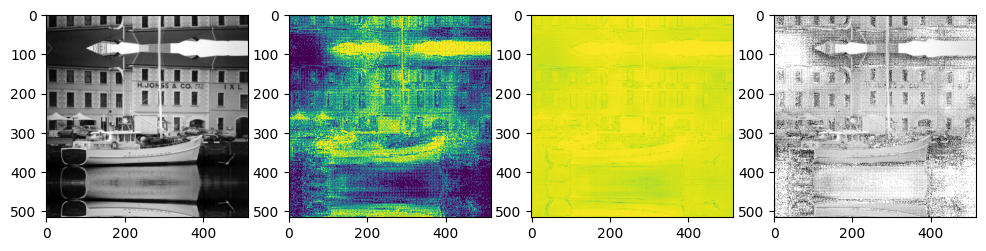

<Figure size 960x720 with 0 Axes>

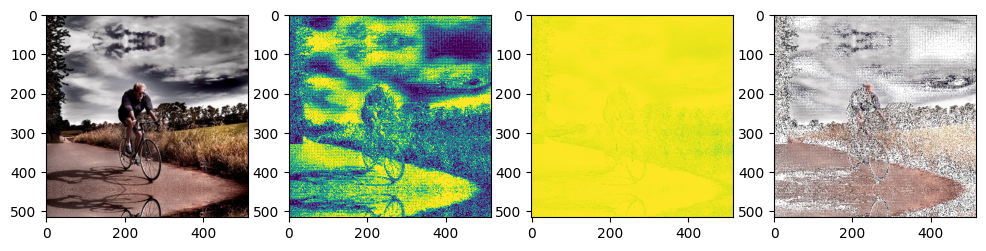

<Figure size 960x720 with 0 Axes>

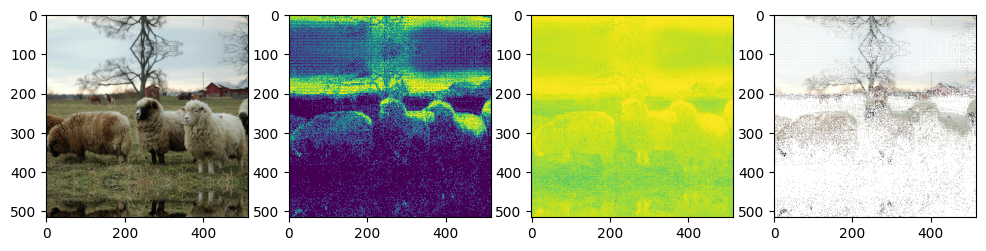

<Figure size 960x720 with 0 Axes>

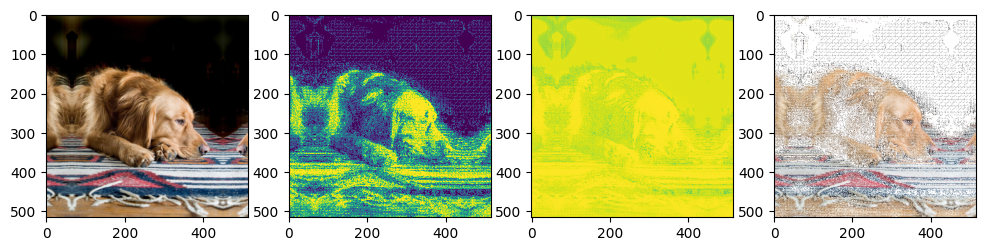

<Figure size 960x720 with 0 Axes>

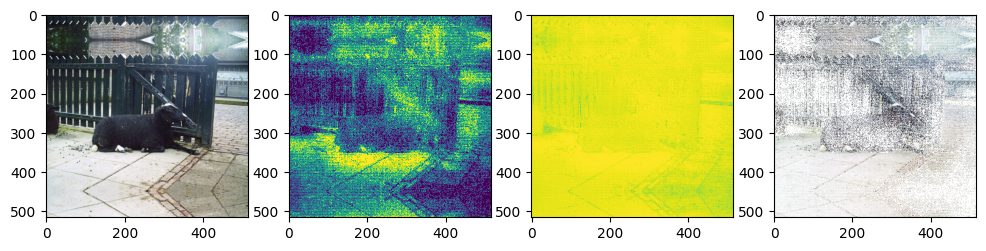

Valset


<Figure size 960x720 with 0 Axes>

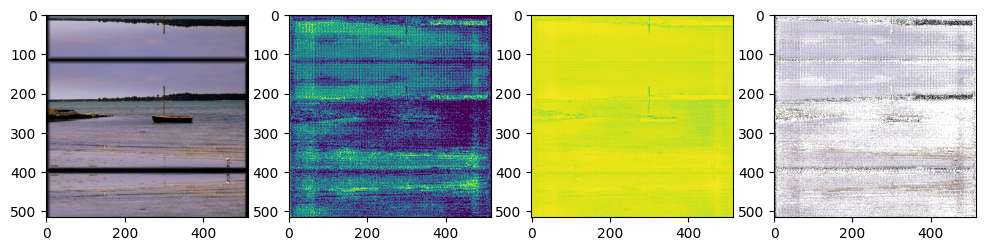

<Figure size 960x720 with 0 Axes>

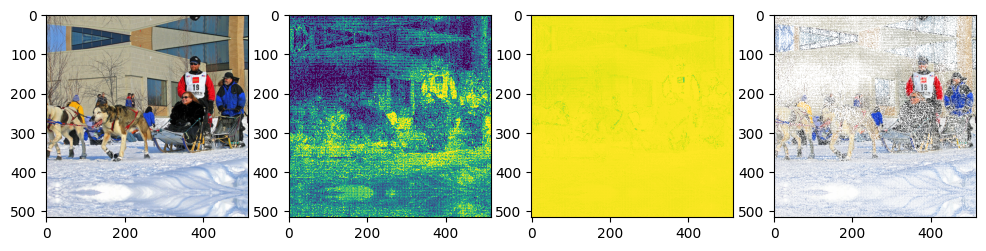

<Figure size 960x720 with 0 Axes>

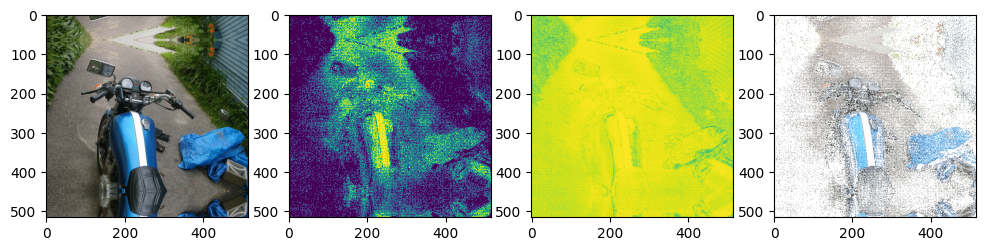

<Figure size 960x720 with 0 Axes>

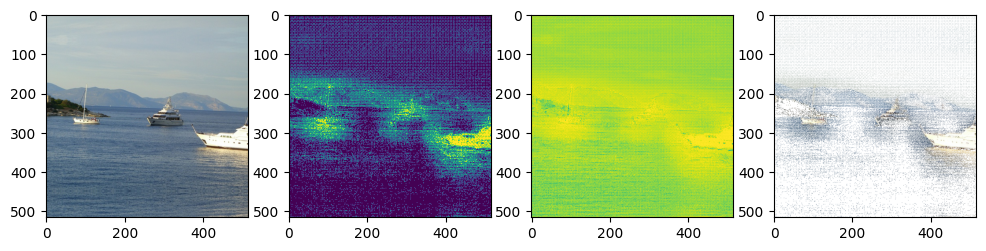

<Figure size 960x720 with 0 Axes>

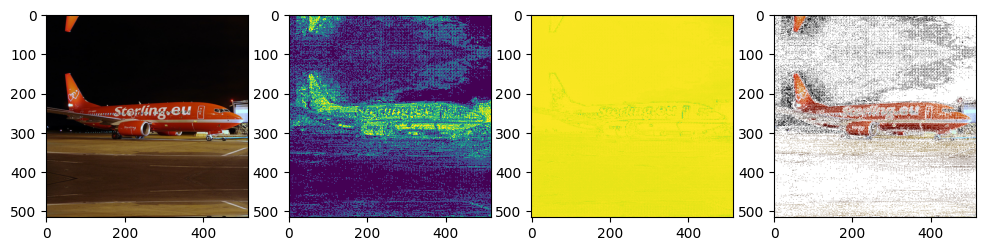

In [79]:
print("Trainset")
show_segmentations(unet, trainset)

print("Valset")
show_segmentations(unet, valset)

# Adding my own Augmentation

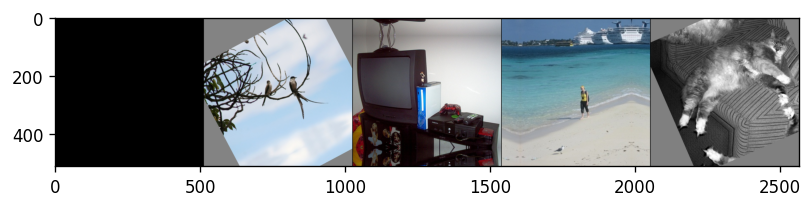

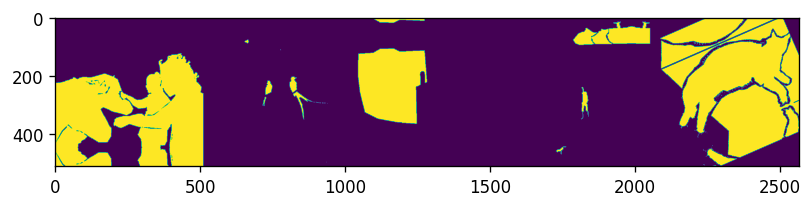

In [108]:
trainset_augmented = VOCDataset(DATA_ROOT, VOC_YEAR, (IMAGE_SIZE, IMAGE_SIZE),
                                multiclass=MULTICLASS, train=True, augment=True)
show_dataset(trainset_augmented)

In [88]:
loss_fn = BCELoss if NUM_CLASSES == 2 else XentLoss

if TRAIN:
    trainset.set_padding(unet.padding)
    valset.set_padding(unet.padding)
    train_model(unet, loss_fn, make_optimizer, trainset_augmented, valset,
                        lr_scheduler_fn=lambda optimizer: None,
                        batch_size=4,
                        eval_steps=500,
                        num_epochs=3)
else:
    unet.load_state_dict(torch.load("checkpoint-aug.pth.tar", map_location=DEVICE))
    plot.show_image("resources/01-1-aug.jpg")

Sanity Checking: 0it [00:00, ?it/s]

/opt/conda/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:442: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
/opt/conda/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:442: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

In [90]:
# torch.save(unet.state_dict(), "checkpoint-aug.pth.tar")

Trainset


<Figure size 960x720 with 0 Axes>

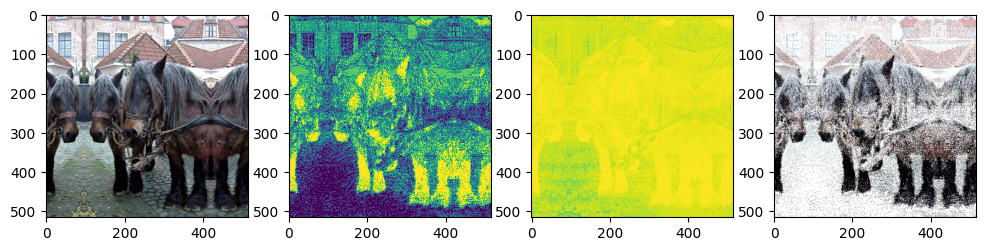

<Figure size 960x720 with 0 Axes>

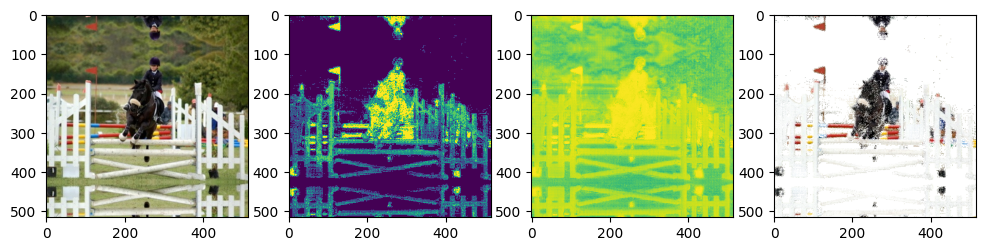

<Figure size 960x720 with 0 Axes>

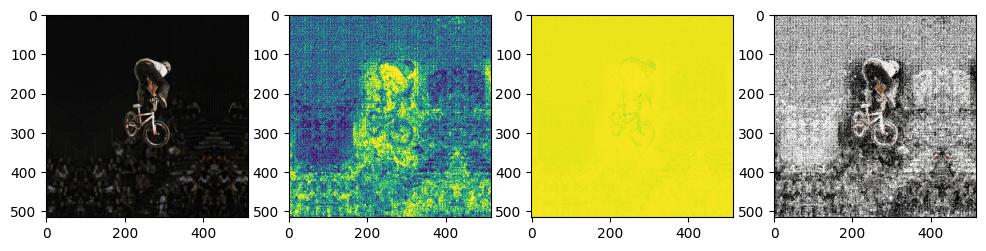

<Figure size 960x720 with 0 Axes>

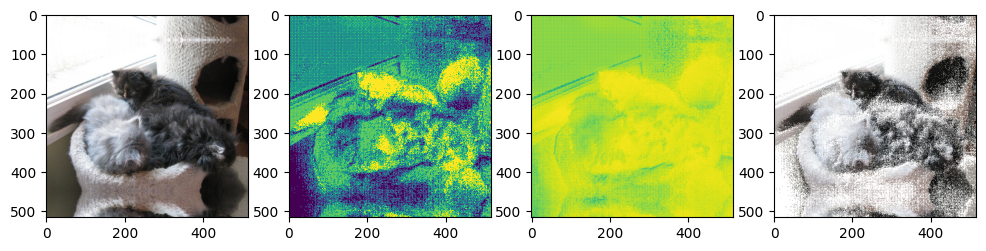

<Figure size 960x720 with 0 Axes>

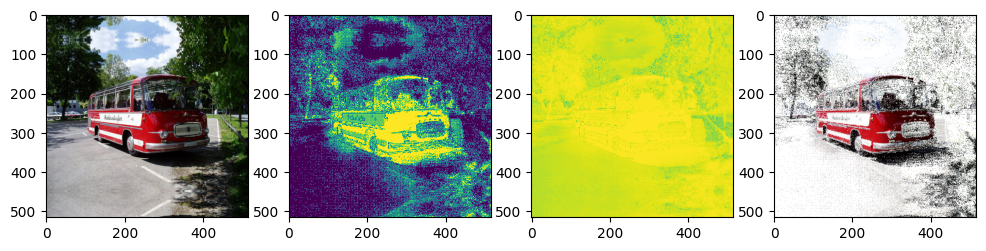

Valset


<Figure size 960x720 with 0 Axes>

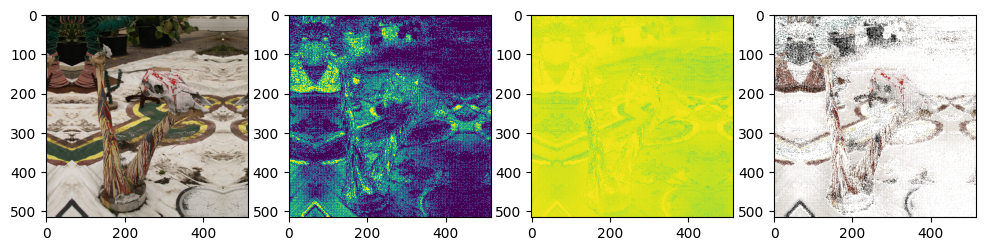

<Figure size 960x720 with 0 Axes>

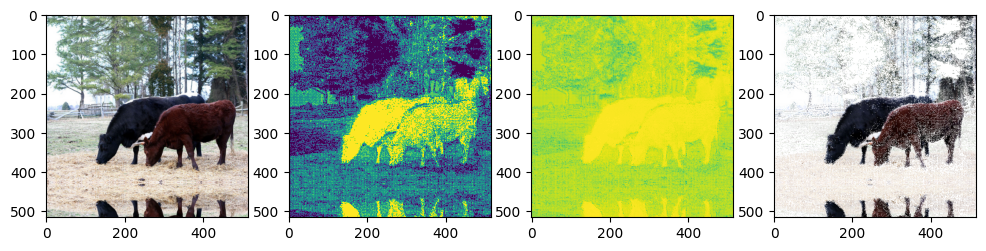

<Figure size 960x720 with 0 Axes>

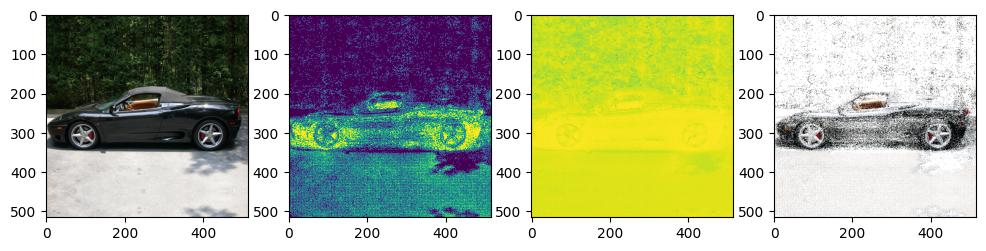

<Figure size 960x720 with 0 Axes>

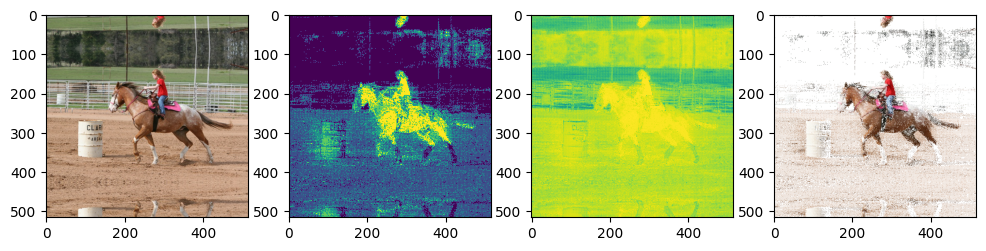

<Figure size 960x720 with 0 Axes>

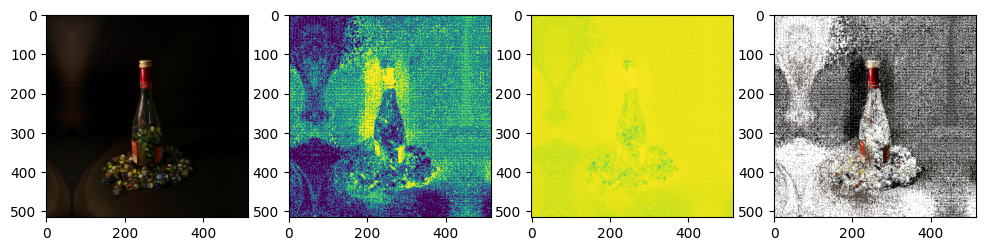

In [91]:
print("Trainset")
show_segmentations(unet, trainset)

print("Valset")
show_segmentations(unet, valset)

### Видно, что добавленные собственные аугментации (Изменение цвета или искажение) дало лучший результат по выделению объектов. Но при этом шум на фоне остался все-таки в большом количестве.

## Теперь изменим функцию потерь на Jaccard + добавим метрику к модели:

### Прямо сейчас сохраненный рантайм с плохо подобранных функций, уже не помню точно что там было

Trainset


<Figure size 960x720 with 0 Axes>

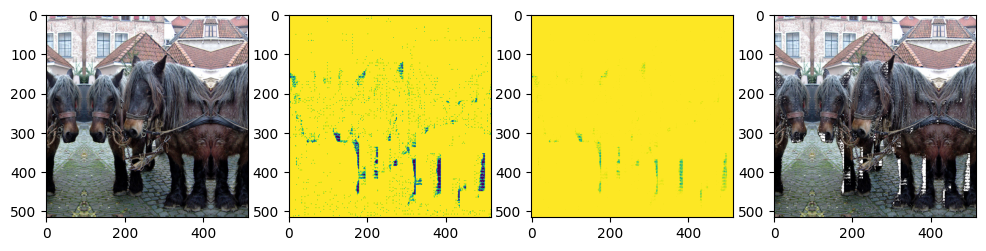

<Figure size 960x720 with 0 Axes>

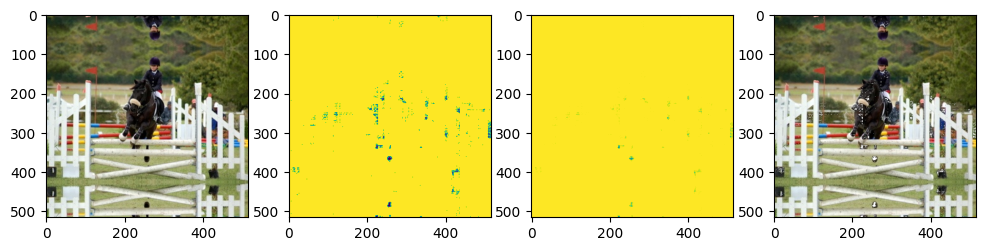

<Figure size 960x720 with 0 Axes>

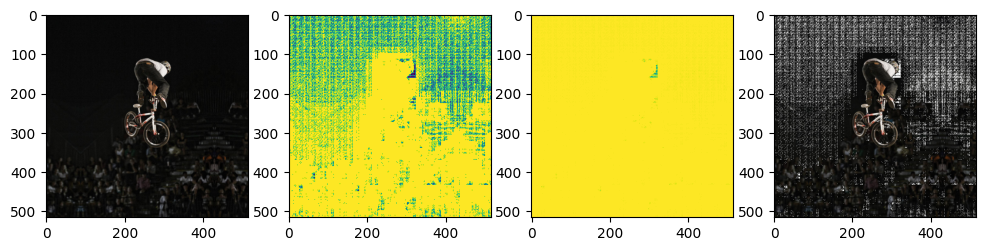

<Figure size 960x720 with 0 Axes>

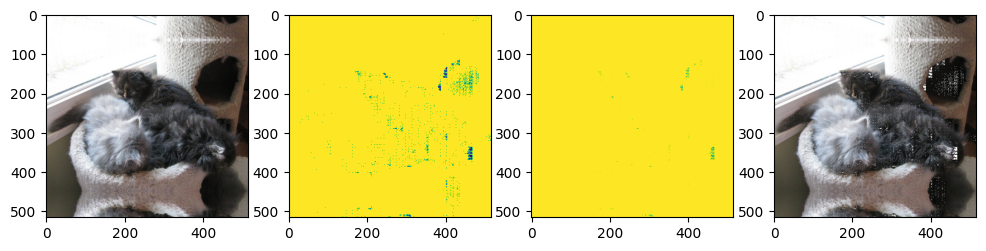

<Figure size 960x720 with 0 Axes>

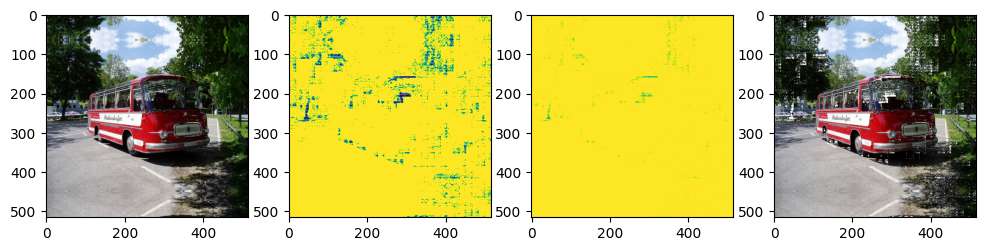

Valset


<Figure size 960x720 with 0 Axes>

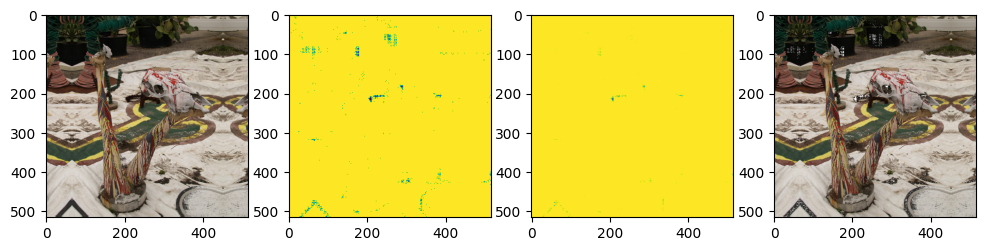

<Figure size 960x720 with 0 Axes>

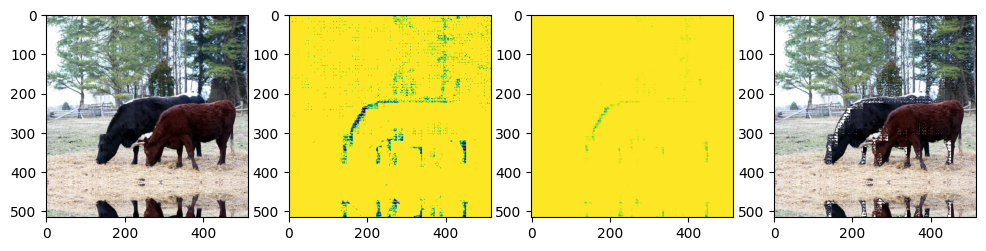

<Figure size 960x720 with 0 Axes>

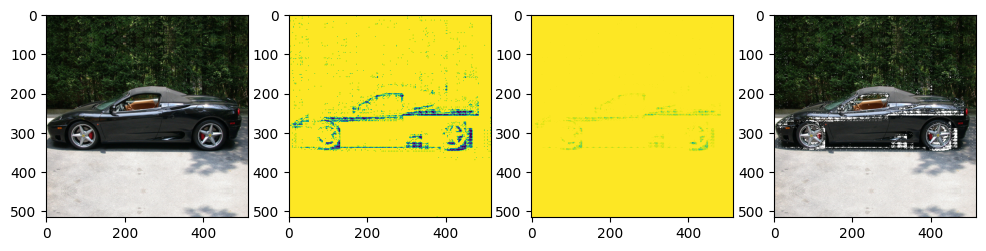

<Figure size 960x720 with 0 Axes>

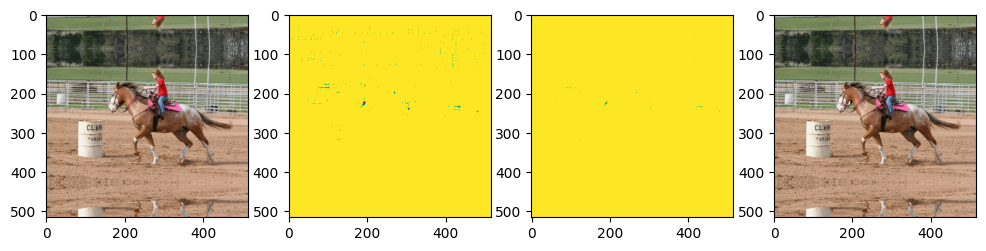

<Figure size 960x720 with 0 Axes>

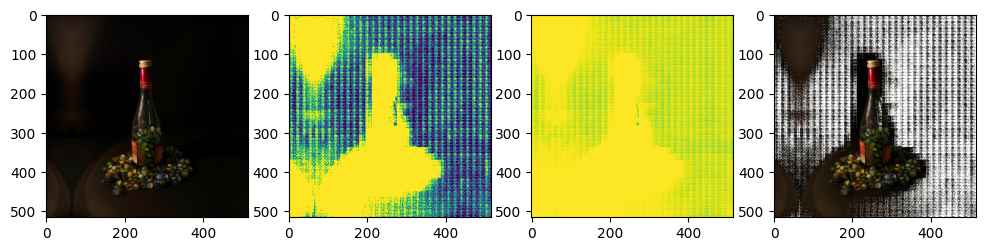

In [147]:
print("Trainset")
show_segmentations(unet, trainset)

print("Valset")
show_segmentations(unet, valset)

In [ ]:
import random
import numpy as np
import torch
import torchvision
import pytorch_lightning as pl
from torchvision.datasets import CIFAR10
# from ignite.metrics import IoU
# from torchmetrics import JaccardIndex


class Module(pl.LightningModule):
    def __init__(self, model, loss_fn, optimizer_fn, trainset, testset,
                 lr_scheduler_fn=None,
                 batch_size=16):
        super().__init__()
        self._model = model
        self._optimizer_fn = optimizer_fn
        self._lr_scheduler_fn = lr_scheduler_fn
        self._criterion = loss_fn()
        self._batch_size = batch_size
        self._trainset = trainset
        self._testset = testset
        
#         if NUM_CLASSES > 2:
#             self.iou = JaccardIndex(num_classes=NUM_CLASSES, task='multiclass')
#         else:
#             self.iou = JaccardIndex(num_classes=NUM_CLASSES, task='binary')
        self.iou = MeanIoU(num_classes=NUM_CLASSES)

        
    def forward(self, input):
        return self._model(input)
    
    def training_step(self, batch, batch_idx):
        # training_step defines the train loop. It is independent of forward
        x, y = batch
        logits = self._model(x)
        loss = self._criterion(logits, y)
        self.logger.experiment.add_scalars("loss", 
                                           {"train": loss}, 
                                           global_step=self.global_step)
        return loss
    
    def validation_step(self, batch, batch_idx):
        x, y = batch
        logits = self._model(x)
        loss = self._criterion(logits, y)
        
        iou = self.iou(logits, y)
        
        self.logger.experiment.add_scalars("loss", {"val": loss}, global_step=self.global_step)
        self.logger.experiment.add_scalars("IoU", {"val": iou}, global_step=self.global_step)
        
        
    def train_dataloader(self):
        return torch.utils.data.DataLoader(self._trainset, batch_size=self._batch_size, shuffle=True, drop_last=True, num_workers=2)
    
    def val_dataloader(self):
        return torch.utils.data.DataLoader(self._testset, batch_size=self._batch_size, shuffle=False, num_workers=2)

    def configure_optimizers(self):
        optimizer = self._optimizer_fn(self._model)
        scheduler = self._lr_scheduler_fn(optimizer)
        if scheduler:
            return [optimizer], [scheduler]
        else:
            return optimizer
    

def train_model(model, loss_fn, optimizer_fn, trainset, testset,
                lr_scheduler_fn=None,
                batch_size=4,
                eval_steps=250,
                num_epochs=1):
    model = Module(model, loss_fn, optimizer_fn, trainset, testset,
                   lr_scheduler_fn, batch_size)
    trainer = pl.Trainer(accelerator='auto', max_epochs=num_epochs, val_check_interval=eval_steps)
    trainer.fit(model)

In [142]:
loss_fn = JaccardLoss if NUM_CLASSES == 2 else XentLoss

if TRAIN:
    trainset.set_padding(unet.padding)
    valset.set_padding(unet.padding)
    train_model(unet, loss_fn, make_optimizer, trainset_augmented, valset,
                        lr_scheduler_fn=lambda optimizer: None,
                        batch_size=4,
                        eval_steps=500,
                        num_epochs=3)
else:
    unet.load_state_dict(torch.load("checkpoint-jac-aug.pth.tar", map_location=DEVICE))
    plot.show_image("resources/01-1-aug.jpg")

Sanity Checking: 0it [00:00, ?it/s]

/opt/conda/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:442: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

In [170]:
loss_fn = JaccardLoss if NUM_CLASSES == 2 else XentLoss

if TRAIN:
    trainset.set_padding(unet.padding)
    valset.set_padding(unet.padding)
    train_model(unet, loss_fn, make_optimizer, trainset_augmented, valset,
                        lr_scheduler_fn=lambda optimizer: None,
                        batch_size=4,
                        eval_steps=500,
                        num_epochs=6)
else:
    unet.load_state_dict(torch.load("checkpoint-jac-aug.pth.tar", map_location=DEVICE))
    plot.show_image("resources/01-1-aug.jpg")

Sanity Checking: 0it [00:00, ?it/s]

/opt/conda/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:442: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
/opt/conda/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:442: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

In [151]:
print(len(trainset_augmented))
print(len(trainset))

2330
2330


In [173]:
torch.save(unet.state_dict(), "checkpoint-jac-aug.pth.tar")

In [172]:
import shutil

folder_to_zip = "./lightning_logs"
zip_filename = "lightning_logs_jac_aug"

shutil.make_archive(zip_filename, 'zip', folder_to_zip)
# shutil.move(zip_filename + '.zip', '/kaggle/working/' + zip_filename)

'/kaggle/working/lightning_logs_jac_aug.zip'

Trainset


<Figure size 960x720 with 0 Axes>

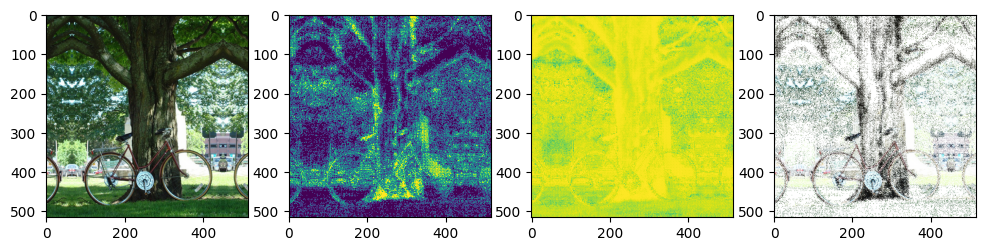

<Figure size 960x720 with 0 Axes>

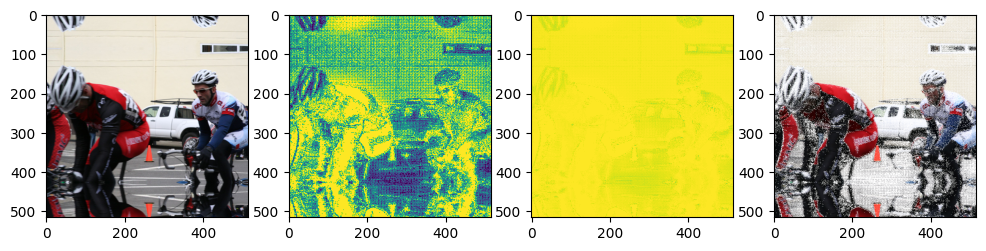

<Figure size 960x720 with 0 Axes>

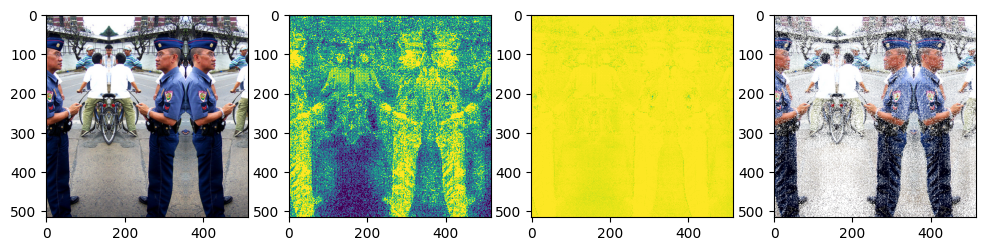

<Figure size 960x720 with 0 Axes>

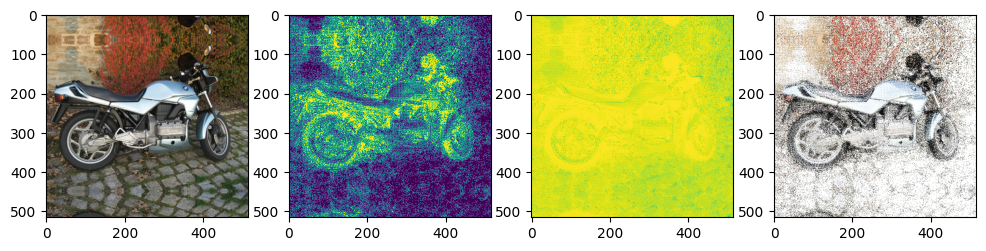

<Figure size 960x720 with 0 Axes>

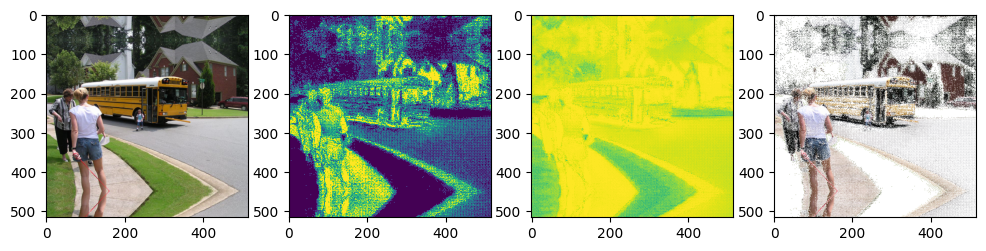

Valset


<Figure size 960x720 with 0 Axes>

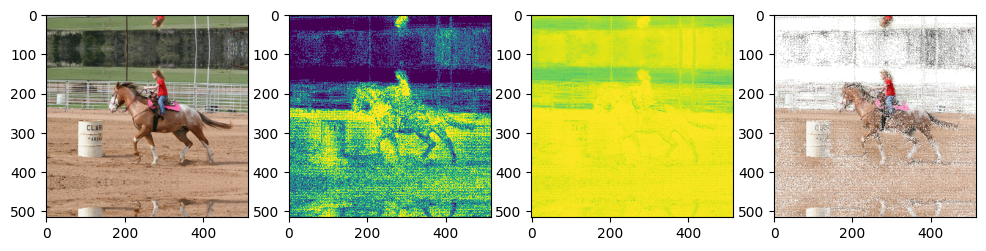

<Figure size 960x720 with 0 Axes>

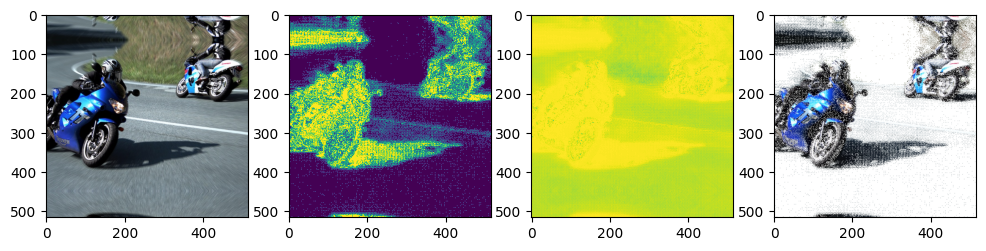

<Figure size 960x720 with 0 Axes>

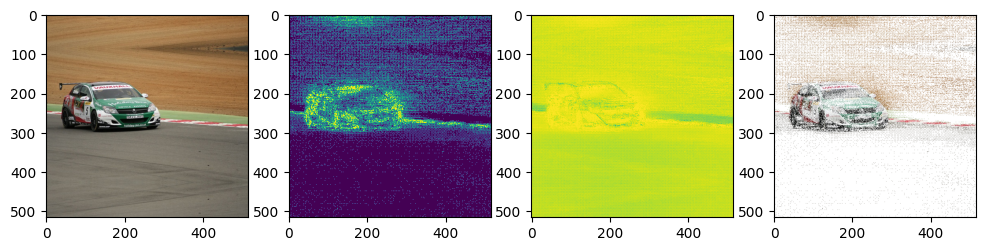

<Figure size 960x720 with 0 Axes>

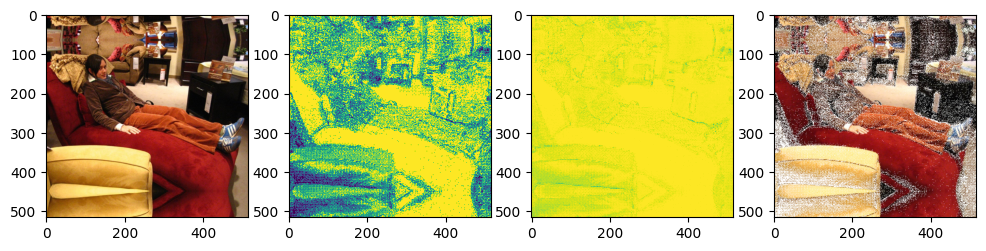

<Figure size 960x720 with 0 Axes>

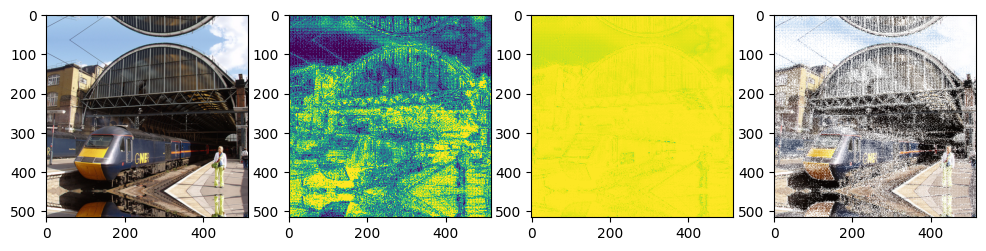

In [171]:
print("Trainset")
show_segmentations(unet, trainset)

print("Valset")
show_segmentations(unet, valset)

# Вывод
Функция IoU работает и показывает хороший результат на выборке, но в ней возникли сложности с разным размером входного и выходного изображения, поэтому на текущей моделе и текущем датасете я бы использовал BCE

### К сожалению внутри kaggle notebook у меня не получилось запустить tensorboard, поэтому я сохранил файлы логов, скачивал их, и смотрел локально через запуск:

```bash
tensorboard --logdir=./lightning_logs_noaug --host 0.0.0.0 --port=6020
```

### Приведу пару скриншотов

Метрика почему-то уменьшалась, это явно связано с тем, что на аугментациях модель обучается гораздо дольше и менее стабильно, и с подбором гипермпараметров

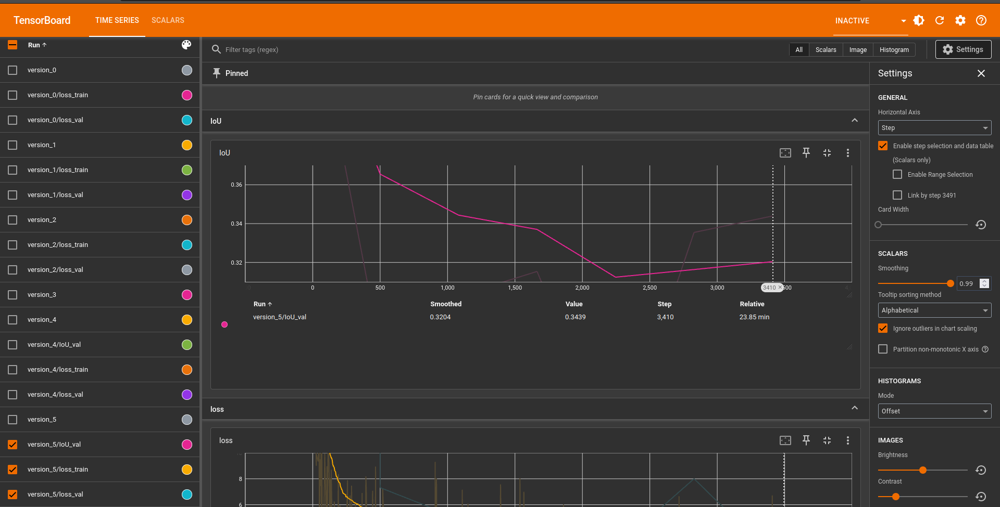

Как видно, метрика вернулась спустя пару эпох на ту, в которой была на первой эпохе. Скорее всего дальше она будет поправляться

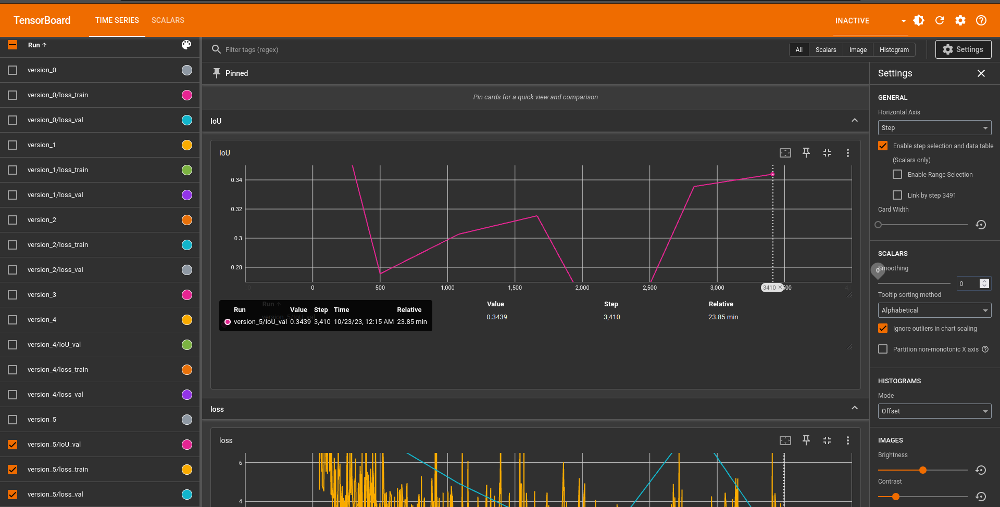

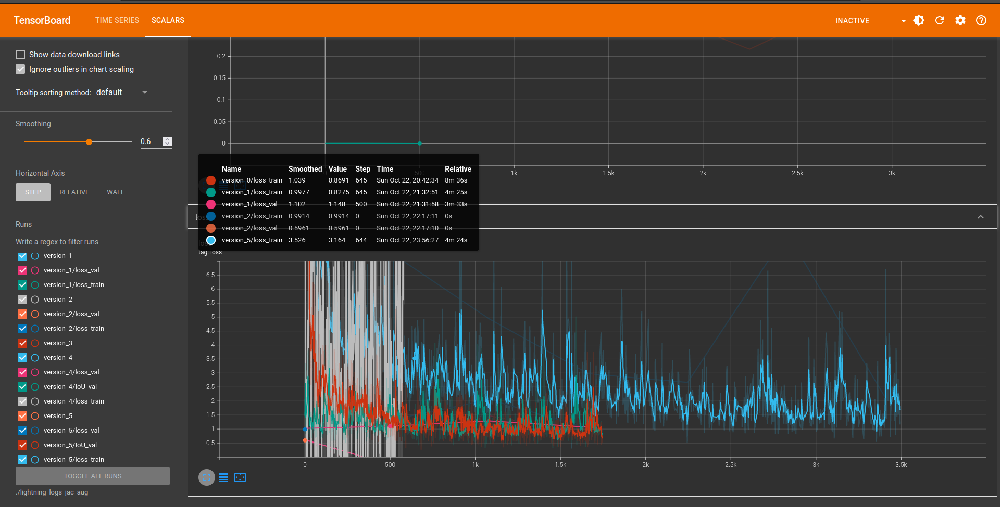

Как видно, в последней моделе (не считая промежуточные 8 моделей, которые я удалил для чистоты графиков) loss на валидации уменьшается стабильно, а на трейне продолжает колебаться, но в целом тоже уменьшается:

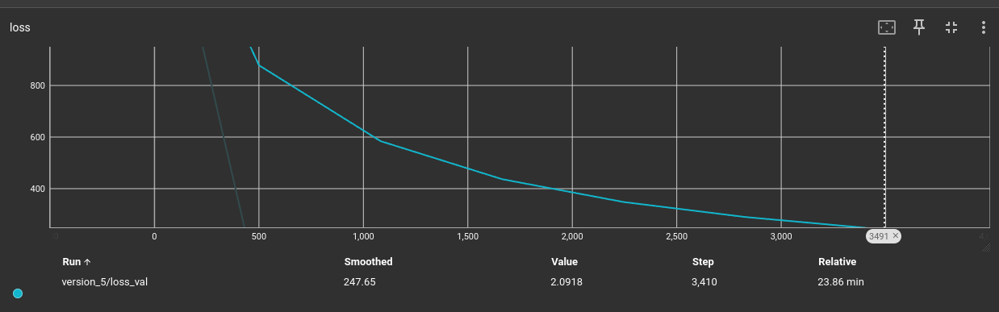

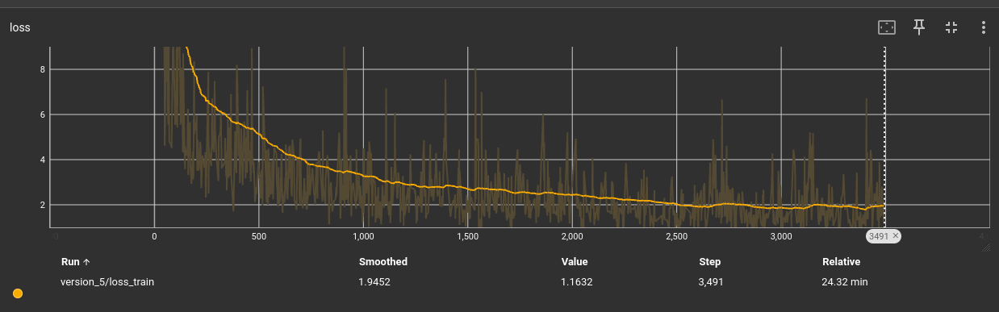